In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install --upgrade --no-cache-dir gdown

Mounted at /content/drive
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14774 sha256=2e9287b492155dc57cc67fbed6d9d13aba52e2a9833a5c2e683c8119c378acb5
  Stored in directory: /tmp/pip-ephem-wheel-cache-2l_awvv2/wheels/fb/c3/0e/c4d8ff8bfcb0461afff199471449f642179b74968c15b7a69c
Successfully built gdown
  Attempting uninstall: gdown
    Found existing installation: gdown 4.2.2
    Uninstalling gdown-4.2.2:
      Successfully uninstalled gdown-4.2.2


In [ ]:
import os
!mkdir '/content/m1_cropped'

In [ ]:
!pip install --upgrade --no-cache-dir gdown

In [ ]:
!pip install pytube
!gdown --id '10NaxFCpitXjtLX0rZ4M02FV0rOGRpLKI' #weights_dummy.pt
!gdown --id '1rJI17Y2u0MDmqv2qkcM6ScOYZpGE_9dd' #weights.caffemodel - opencv face detection neural network
!gdown --id '1M38YE0S9ZztaKK9JJ1GeBbUqIunAimRV' #deploy.prototext file for caffemodel

     |████████████████████████████████| 56 kB 4.8 MB/s 
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=10NaxFCpitXjtLX0rZ4M02FV0rOGRpLKI
To: /content/weights_dummy.pt
100% 166M/166M [00:12<00:00, 12.9MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1rJI17Y2u0MDmqv2qkcM6ScOYZpGE_9dd
To: /content/weights.caffemodel
100% 5.35M/5.35M [00:00<00:00, 56.1MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to

## **Detecting humans**

In [ ]:
## Preparing the setups

import torch
from math import floor, ceil
cuda_enable = True
if torch.cuda.is_available():
  device = torch.device("cuda:0")
  print("GPU")
else:
  device = torch.device("cpu")
  print("CPU")

GPU


In [ ]:
## Importing the requirements

import os
import shutil 
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torch import nn
from pycocotools.coco import COCO
from torchvision import datasets, transforms, models
import cv2
from google.colab.patches import cv2_imshow
from pytube import YouTube
from google.colab import files

In [ ]:
## Getting the transformations

def get_transforms(train):
  trans = []
  if train:
    trans.append(transforms.RandomHorizontalFlip(0.5))
    trans.append(transforms.RandomAffine(0, shear=10, scale=(0.8, 1.2)))
    trans.append(transforms.ColorJitter(brightness=1, contrast=1, saturation=1))
  trans.append(transforms.ToTensor())
  return transforms.Compose(trans)

### **Uncomment the following cells to train the model again, in that case comment out/do not run the 'Training is skipped and model is loaded with pretrained weights' section.**

In [ ]:
'''
!git clone https://github.com/Chang-Chia-Chi/Pedestrian.git
!git clone https://github.com/Chang-Chia-Chi/Final-Project.git
'''

'\n!git clone https://github.com/Chang-Chia-Chi/Pedestrian.git\n!git clone https://github.com/Chang-Chia-Chi/Final-Project.git\n'

### **Training is skipped and model is loaded with pretrained weights**

In [ ]:
## Making the model m1

model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# change question to binary classification (human, not human)
num_classes = 2
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
params = [p for p in model.parameters() if p.requires_grad]
model = model.to(device)
model.load_state_dict(torch.load('/content/weights_dummy.pt'))

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

<All keys matched successfully>

### **Cropping out the persons**

In [ ]:
## Converting the Image

def im_convert(tensor):
    image = tensor.clone().detach().cpu().numpy()
    image = image.transpose(1, 2, 0)
    image = image * np.array((0.5, 0.5, 0.5)) + np.array((0.5, 0.5, 0.5))
    image = image.clip(0, 1)
    return image

In [ ]:
## Making the dictinary that would contasin the path as key and the bounding box as value

all_boxes = {}

In [ ]:
## Getting the bounding box

def get_bbox(frame,model,x,k):
  img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

  val_tran = get_transforms(train=False)
  im_pil = Image.fromarray(img)
  im_pil = val_tran(im_pil)

  image = im_pil.to(device)
  model_val = model.eval()
  output = model([image])

  scores = output[0]['scores'].detach().cpu().numpy()
  num_people = len(scores[scores > 0.7])

  boxes = output[0]['boxes'].detach().cpu().numpy()
  boxes = boxes[:num_people]

  scores = scores[:num_people]
  indices =  torch.ops.torchvision.nms(torch.Tensor(boxes),torch.Tensor(scores),0.25).tolist()
  
  container = []
  new_scores = []
  size = 0
  if len(indices)==0:
    return 
  for i in indices:
    container.append([boxes[i][0], boxes[i][1], boxes[i][2], boxes[i][3]])
    new_scores.append(scores[i])
    all_boxes['/content/m1_cropped/B_{f0}_{f1}_BC{f2}.jpg'] = [boxes[i][0], boxes[i][1], boxes[i][2], boxes[i][3]]
    size+=1
  for i in range(len(indices)):
    crop = img[floor(container[i][1]):ceil(container[i][3]), floor(container[i][0]): ceil(container[i][2])]
    resize = cv2.resize(crop, (112,112))
    resize = cv2.cvtColor(resize, cv2.COLOR_BGR2RGB)
    cv2.imwrite("/content/m1_cropped/B_{f0}_{f1}_BC{f2}.jpg".format(f0=k,f1=int(x),f2=i), resize)

### **Get the input video/image to crop out the persons**

In [ ]:
## Function for video processing

def videoDataProcessing(model,path = '/content/VideoData.mp4',k=0):
    cap = cv2.VideoCapture(path)
    i = 1
    while cap.isOpened():
        ret, frame = cap.read()
        if ret and i%20==0:
            get_bbox(frame,model,i/20,k)
            print(i)
        elif not ret:
            break
        i+=1
        if cv2.waitKey(20) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

In [ ]:
## Getting the vieo from the youtube

def get_from_YouTube(link):
    Link = link
    yt = YouTube(Link)
    stream = yt.streams.filter(res='720p').first()
    stream.download(filename='VideoData.mp4')

### **Taking the inputs from the user.**

In [ ]:
## Function for taking the input from the video or from the image

print("Enter 0 for uploading a video file.\nEnter 1 for uploading images.")
entry = int(input())
if os.path.isdir('/content/m1_cropped'):
    shutil.rmtree('/content/m1_cropped')
os.mkdir('/content/m1_cropped')
if entry==0:
    print("Enter 0 for uploading youtube video.\nEnter 1 for uploading local files.")
    entry2 = int(input())
    if entry2==0:
        print("Enter youTube video link.")
        link = input()
        get_from_YouTube(link)
        videoDataProcessing(model)
    else:
        uploaded = files.upload()
        if os.path.isdir('/content/Videos'):
            shutil.rmtree('/content/Videos')
        os.mkdir('Videos')
        upload_folder = '/content/Videos'
        k=0
        for filename in uploaded.keys():
            dst_path = os.path.join(upload_folder, filename)
            print(f'move {filename} to {dst_path}')
            shutil.move(filename, dst_path)
            print(dst_path)
            videoDataProcessing(model,dst_path,k)
            k+=1
else:
    uploaded = files.upload()
    if os.path.isdir('/content/Images'):
        shutil.rmtree('/content/Images')
    os.mkdir('Images')
    upload_folder = 'Images'
    i=0
    k=0
    for filename in uploaded.keys():
        dst_path = os.path.join(upload_folder, filename)
        print(f'move {filename} to {dst_path}')
        shutil.move(filename, dst_path)
        frame = cv2.imread(dst_path)
        get_bbox(frame,model,i,k)
        i+=1
        k+=1

Enter 0 for uploading a video file.
Enter 1 for uploading images.
0
Enter 0 for uploading youtube video.
Enter 1 for uploading local files.
0
Enter youTube video link.
https://youtu.be/KMJS66jBtVQ


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


20
40
60
80
100
120
140
160
180
200
220
240
260
280
300
320
340
360
380
400
420
440
460
480
500
520
540
560
580
600
620
640
660
680
700
720
740
760
780
800
820
840
860
880
900
920
940
960
980
1000
1020
1040
1060
1080
1100
1120
1140
1160
1180
1200
1220
1240
1260
1280


### **OpenCV CaffeModel for face recognition**

In [ ]:
# Define paths
base_dir = '/content/'
prototxt_path = os.path.join(base_dir + 'deploy.prototxt')
caffemodel_path = os.path.join(base_dir + 'weights.caffemodel')

# Read the model

model = cv2.dnn.readNetFromCaffe(prototxt_path, caffemodel_path)

In [ ]:
# Create directory 'updated_images' and if it exists then delete it first.

if os.path.isdir('/content/updated_images'):
    shutil.rmtree('/content/updated_images')
os.makedirs('updated_images')

In [ ]:
# Create directory 'faces' and if it exists then delete it first.

if os.path.isdir('/content/faces'):
    shutil.rmtree('/content/faces')
os.makedirs('faces')

In [ ]:
# Loop through all images and save images with marked faces

for file in os.listdir(base_dir + 'm1_cropped'):
  file_name, file_extension = os.path.splitext(file)
  image = cv2.imread(base_dir + 'm1_cropped/' + file)

  (h, w) = image.shape[:2]
  blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))

  model.setInput(blob)
  detections = model.forward()

  # Create frame around face
  for i in range(0, detections.shape[2]):
    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
    (startX, startY, endX, endY) = box.astype("int")

    confidence = detections[0, 0, i, 2]

    # If confidence > 0.5, show box around face
    if (confidence > 0.5):
      cv2.rectangle(image, (startX, startY), (endX, endY), (255, 255, 255), 2)

  cv2.imwrite(base_dir + 'updated_images/' + file, image)
  print("Image " + file + " converted successfully")

  # Identify each face
  count=0
  for i in range(0, detections.shape[2]):
    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
    (startX, startY, endX, endY) = box.astype("int")

    confidence = detections[0, 0, i, 2]

    # If confidence > 0.5, save it as a separate file
    if (confidence > 0.5):
      count += 1
      frame = image[startY:endY, startX:endX]
      cv2.imwrite(base_dir + 'faces/' + file, frame)                                

# **M2**

In [ ]:
# Clone Real-ESRGAN and enter the Real-ESRGAN
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop
# Download the pre-trained model
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P experiments/pretrained_models

Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 583, done.
remote: Total 583 (delta 0), reused 0 (delta 0), pack-reused 583
Receiving objects: 100% (583/583), 4.97 MiB | 42.42 MiB/s, done.
Resolving deltas: 100% (299/299), done.
/content/Real-ESRGAN
     |████████████████████████████████| 161 kB 24.4 MB/s 
     |████████████████████████████████| 5.8 MB 61.5 MB/s 
     |████████████████████████████████| 190 kB 73.8 MB/s 
  Created wheel for basicsr: filename=basicsr-1.3.5-py3-none-any.whl size=194483 sha256=a04b29078de78f9e16524b540da0452644f374f306ab60d2a64d3e338c5d5fa6
  Stored in directory: /root/.cache/pip/wheels/74/1b/d0/8659cf028233dd1e3bf282271009fbf037dfc4ab761f32a032
Successfully built basicsr
     |████████████████████████████████| 59 kB 7.2 MB/s 
     |████████████████████████████████| 177 kB 46.6 MB/s 
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110474 sha256=c2fd6c5f2258ad6a61b67fc65b51615eb633edcf88155d5b6bc236b1d12384da
  Stored 

running develop
running egg_info
creating realesrgan.egg-info
writing realesrgan.egg-info/PKG-INFO
writing dependency_links to realesrgan.egg-info/dependency_links.txt
writing requirements to realesrgan.egg-info/requires.txt
writing top-level names to realesrgan.egg-info/top_level.txt
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
adding license file 'LICENSE'
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
running build_ext
Creating /usr/local/lib/python3.7/dist-packages/realesrgan.egg-link (link to .)
Adding realesrgan 0.2.4.0 to easy-install.pth file

Installed /content/Real-ESRGAN
Processing dependencies for realesrgan==0.2.4.0
Searching for tqdm==4.63.0
Best match: tqdm 4.63.0
Adding tqdm 4.63.0 to easy-install.pth file
Installing tqdm script to /usr/local/bin

Using /usr/local/lib/python3.7/dist-packages
Searching for torchvision==0.11.1+cu111
Best match: torchvision 0.11.1+cu111
Adding torchvision 0.11.1+cu111 to easy-inst

### **Upload m1_cropped, Upload the body shape images to be processed by Real-ESRGAN**

In [ ]:
## Gwtting the files of the cropped images

mypath = '/content/m1_cropped'
from os import listdir
from os.path import isfile, join
onlyfiles = [f"/content/m1_cropped/"+f for f in listdir(mypath) if isfile(join(mypath, f))]

In [ ]:
## Making the folders

import os
from google.colab import files
import shutil

upload_folder = 'upload'
result_folder = 'results'

if os.path.isdir(upload_folder):
    shutil.rmtree(upload_folder)
if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)
os.mkdir(upload_folder)
os.mkdir(result_folder)

In [ ]:
## Copying the files

for f in onlyfiles:
    shutil.copy(f, '/content/Real-ESRGAN/upload/')

3. Inference for body images


In [ ]:
# if it is out of memory, try to use the `--tile` option
# We upsample the image with the scale factor X3.5
!python inference_realesrgan.py -n RealESRGAN_x4plus --i upload --outscale 2 --half --face_enhance
# Arguments
# -n, --model_name: Model names
# -i, --input: input folder or image
# --outscale: Output scale, can be arbitrary scale factore. 

Downloading: "https://github.com/xinntao/facexlib/releases/download/v0.1.0/detection_Resnet50_Final.pth" to /usr/local/lib/python3.7/dist-packages/facexlib/weights/detection_Resnet50_Final.pth

100% 104M/104M [00:09<00:00, 11.9MB/s] 
Downloading: "https://github.com/TencentARC/GFPGAN/releases/download/v1.3.0/GFPGANv1.3.pth" to /usr/local/lib/python3.7/dist-packages/gfpgan/weights/GFPGANv1.3.pth

100% 332M/332M [00:10<00:00, 33.3MB/s]
Testing 0 B_0_10_BC0
Testing 1 B_0_10_BC1
Testing 2 B_0_10_BC2
Testing 3 B_0_10_BC3
Testing 4 B_0_10_BC4
Testing 5 B_0_10_BC5
Testing 6 B_0_11_BC0
Testing 7 B_0_11_BC1
Testing 8 B_0_11_BC2
Testing 9 B_0_11_BC3
Testing 10 B_0_11_BC4
Testing 11 B_0_11_BC5
Testing 12 B_0_12_BC0
Testing 13 B_0_12_BC1
Testing 14 B_0_12_BC2
Testing 15 B_0_12_BC3
Testing 16 B_0_12_BC4
Testing 17 B_0_12_BC5
Testing 18 B_0_12_BC6
Testing 19 B_0_12_BC7
Testing 20 B_0_13_BC0
Testing 21 B_0_13_BC1
Testing 22 B_0_13_BC2
Testing 23 B_0_13_BC3
Testing 24 B_0_13_BC4
Testing 25 B_0_14_BC0


In [ ]:
!mv '/content/Real-ESRGAN/results' '/content/'
%cd ..
if os.path.isdir('/content/body_images'):
    shutil.rmtree('/content/body_images')
os.rename("results", "body_images")

/content


3. Upload faces
<br>
Upload the face shape images to be processed by Real-ESRGAN

In [ ]:
%cd Real-ESRGAN

/content/Real-ESRGAN


In [ ]:
# !mkdir '/content/Real-ESRGAN/Real_ESRGAN'
# !mv '/content/m1_cropped' '/content/Real-ESRGAN'

In [ ]:
## Getting the files from the faces folder

mypath = '/content/faces'
from os import listdir
from os.path import isfile, join
onlyfiles = [f"/content/faces/"+f for f in listdir(mypath) if isfile(join(mypath, f))]

In [ ]:
## Making the folder

import os
from google.colab import files
import shutil

upload_folder = 'upload'
result_folder = 'results'

if os.path.isdir(upload_folder):
    shutil.rmtree(upload_folder)
if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)
os.mkdir(upload_folder)
os.mkdir(result_folder)

In [ ]:
## Copying the file to desired folder

for f in onlyfiles:
    shutil.copy(f, '/content/Real-ESRGAN/upload/')

# 4. Inference for face images


In [ ]:
# if it is out of memory, try to use the `--tile` option
# We upsample the image with the scale factor X3.5
!python inference_realesrgan.py -n RealESRGAN_x4plus --i upload --outscale 2 --half --face_enhance
# Arguments
# -n, --model_name: Model names
# -i, --input: input folder or image
# --outscale: Output scale, can be arbitrary scale factore. 

Testing 0 B_0_11_BC5
Testing 1 B_0_12_BC0
Testing 2 B_0_12_BC1
Testing 3 B_0_14_BC2
Testing 4 B_0_15_BC3
Testing 5 B_0_30_BC0
Testing 6 B_0_33_BC0
Testing 7 B_0_36_BC4
Testing 8 B_0_37_BC1
Testing 9 B_0_38_BC1
Testing 10 B_0_39_BC2
Testing 11 B_0_40_BC3
Testing 12 B_0_44_BC2
Testing 13 B_0_47_BC3
Testing 14 B_0_51_BC0
Testing 15 B_0_53_BC0
Testing 16 B_0_56_BC0
Testing 17 B_0_57_BC0
Testing 18 B_0_58_BC1
Testing 19 B_0_63_BC2
Testing 20 B_0_7_BC0


In [ ]:
!mv '/content/Real-ESRGAN/results' '/content/'
%cd ..
os.rename("results","face_images")

/content


# M3

In [ ]:
## Importing the requirements

import torch
import torch.nn as nn
import torchvision
import torchvision.models as models
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import cv2
import os
import seaborn as sns
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import confusion_matrix
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt

## Model

In [ ]:
## Defining the model

class ConvNeuralNet(nn.Module):
	#  Determine what layers and their order in CNN object 
    def __init__(self, num_classes):
        super(ConvNeuralNet, self).__init__()
        self.conv_layer1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3)
        self.relu1 = nn.ReLU()
        self.max_pool1 = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.conv_layer2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3)
        self.relu2 = nn.ReLU()
        self.max_pool2 = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.conv_layer3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3)
        self.relu3 = nn.ReLU()
        self.max_pool3 = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.flat = nn.Flatten()
        self.fc1 = nn.Linear(23040, 1024)
        self.fc2 = nn.Linear(1024, 1024)
        self.fc3 = nn.Linear(1024, 5)
    
    def forward(self, x):

        out = self.conv_layer1(x)
        out = self.relu1(out)
        out = self.max_pool1(out)

        out = self.conv_layer2(out)
        out = self.relu2(out)
        out = self.max_pool2(out)
                
        out = self.conv_layer3(out)
        out = self.relu3(out)
        out = self.max_pool3(out)
        
        out = self.flat(out)
        out = self.fc1(out)
        out = self.fc2(out)
        out = self.fc3(out)

        return out

In [ ]:
## Making the model

model = ConvNeuralNet(5)
!gdown --id '1-iH5j9dfS6EuSClH1EdAd8gKFN_5U4Ln'

try:
  model.load_state_dict(torch.load('/content/0.757543.pth', map_location=torch.device('cpu')))
except:
  print("The weights are not loaded")

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1-iH5j9dfS6EuSClH1EdAd8gKFN_5U4Ln
To: /content/0.757543.pth
100% 100M/100M [00:02<00:00, 37.8MB/s] 


In [ ]:
## Detaching the classification layers

scratch_model = nn.Sequential(*list(model.children())[:-3])

Age and Gender mixed Neural Network

In [ ]:
## Freezing the layers, since they have been already trained

for param in scratch_model.parameters():
  param.requires_grad = False

In [ ]:
## Model predicting the age as well as the gender

class AgeGenderPrediction_body(nn.Module):
    
    def __init__(self, age_labels, base_model = None):
      super().__init__()

      if base_model is None:
        self.base_model = vgg16()
      else:
        self.base_model = base_model
      self.gender_classification = nn.Sequential(
                                                  nn.Linear(in_features = 23040, out_features = 512, bias = True),
                                                  nn.ReLU(inplace = True),
                                                  nn.Linear(in_features = 512, out_features = 256, bias = True),
                                                  nn.ReLU(inplace=True),
                                                  nn.Linear(in_features = 256, out_features = 2, bias = True),
                                              )
      
      self.age_classification = nn.Sequential(
                                                  nn.Linear(in_features = 23040, out_features = 512, bias = True),
                                                  nn.ReLU(inplace = True),
                                                  nn.Linear(in_features = 512, out_features = 256, bias = True),
                                                  nn.ReLU(inplace=True),
                                                  nn.Linear(in_features = 256, out_features = age_labels, bias = True),
                                              )

    def forward(self, x):
      base_output = self.base_model(x)
      base_output = base_output.view(base_output.shape[0], -1)
      gender = self.gender_classification(base_output)
      age = self.age_classification(base_output)

      return age, gender

For Training and Validation of (Age + Gender) Model on body_images 

Inference for (Age+Gender) Model on body_images

In [ ]:
# step 1
path = '/content/body_images'
entry = os.listdir(path)

In [ ]:
## Test dataset

class Test_Prepare(Dataset):
  """
  The Class will act as the container for our dataset. It will take your dataframe, the root path, and also the transform function for transforming the dataset.
  """
  def __init__(self, base_path,entry, transform=None):
    self.base_path = base_path
    self.entry = entry
    self.transform = transform
  def __len__(self):
    # Return the length of the dataset
    return len(self.entry)
  def __getitem__(self, idx):
    # Return the observation based on an index. Ex. dataset[0] will return the first element from the dataset, in this case the image and the label.
    if torch.is_tensor(idx):
      idx = idx.tolist()    
    img_name = os.path.join(self.base_path, str(self.entry[idx]))
    image = Image.open(img_name)
    if self.transform:
      image = self.transform(image)
    return image

In [ ]:
## Making the train dataset

test_dataset = Test_Prepare(path, entry, transform = transforms.Compose([transforms.ToTensor(), transforms.Resize((160, 60))]))
dataloader = torch.utils.data.DataLoader(test_dataset, batch_size = 16)

In [ ]:
#model define
model_body = AgeGenderPrediction_body(5, scratch_model)

In [ ]:
# import weights of age and gender from body images trained model in PETA datset folder.
!gdown --id '1-ckkov-5MHi2s5yFK2yvshzubNfGvVom'
#load weights
model_body.load_state_dict(torch.load('/content/0.668123.pth', map_location=torch.device('cpu')))

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1-ckkov-5MHi2s5yFK2yvshzubNfGvVom
To: /content/0.668123.pth
100% 96.9M/96.9M [00:01<00:00, 60.1MB/s]


<All keys matched successfully>

In [ ]:
## Testing the function

def test(model, dataloaders, device):
  model.to(device)
  model.eval()
  
  image = []
  prediction_age = []
  prediction_gender = []


  with torch.no_grad():
      for inputs in tqdm(dataloaders):
          inputs = inputs.to(device)

          image.extend(inputs.detach().cpu().numpy().tolist())
          age, gender = model(inputs)
          _, preds_age = torch.max(age, 1)
          _, preds_gender = torch.max(gender, 1)
          
          prediction_age.extend(preds_age.detach().cpu().numpy().tolist())
          prediction_gender.extend(preds_gender.detach().cpu().numpy().tolist())

  return image,prediction_age,prediction_gender

In [ ]:
## Making the test predictions

device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
image, preds_age, preds_gender = test(model_body, dataloader, device)

  0%|          | 0/18 [00:00<?, ?it/s]

In [ ]:
## Loading the images

images=[]
for i in range(len(preds_age)):
    images.append(np.transpose(np.array(image[i]), (1,2,0)))

images = np.array(images)

1 1


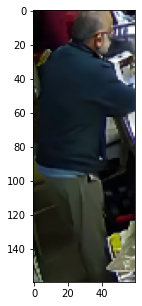

1 1


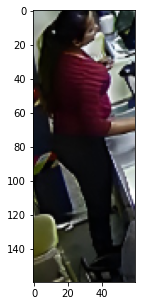

3 1


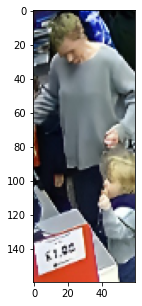

1 1


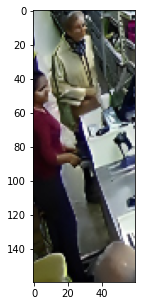

2 1


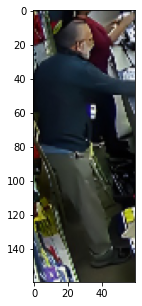

1 1


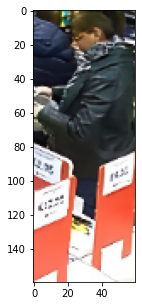

3 0


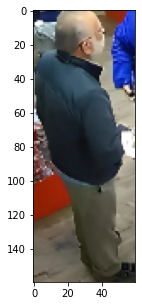

1 1


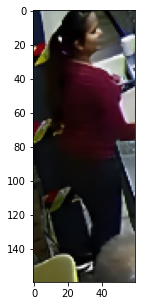

1 0


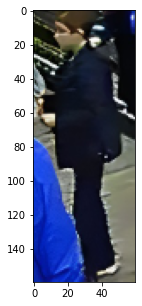

1 1


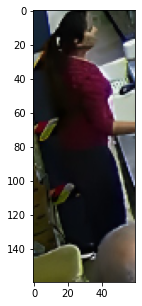

1 1


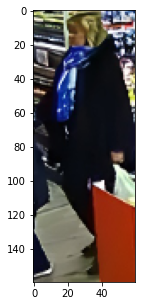

1 0


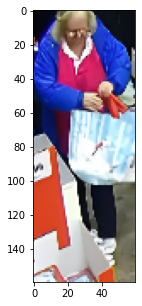

2 1


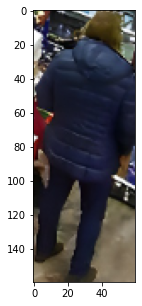

1 1


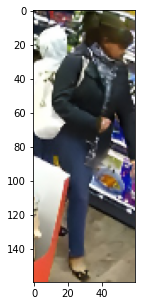

1 1


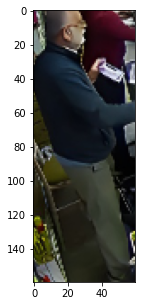

1 0


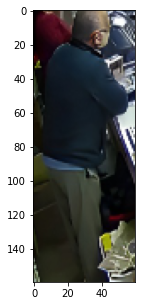

1 0


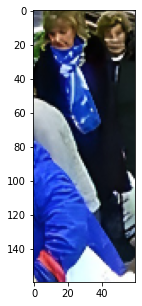

2 1


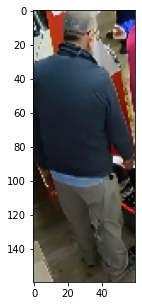

2 0


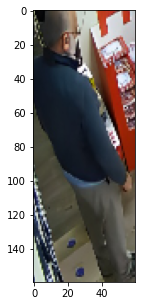

2 1


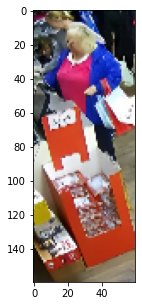

2 1


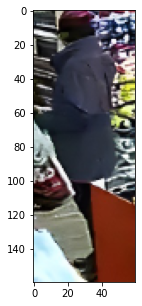

1 1


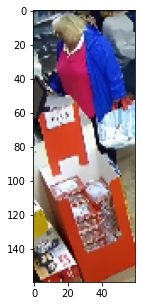

1 0


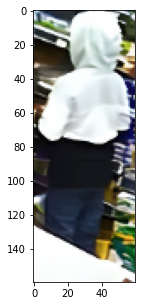

1 1


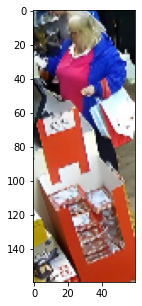

1 1


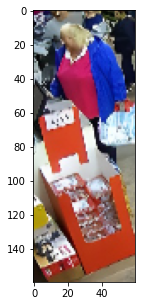

1 1


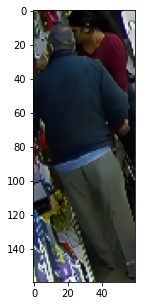

2 1


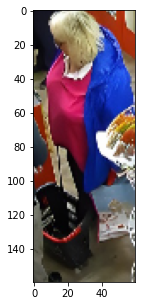

1 1


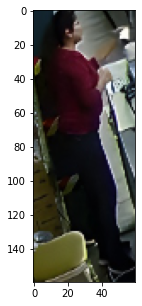

1 1


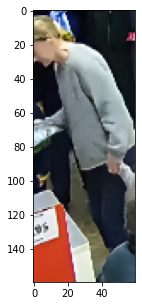

1 0


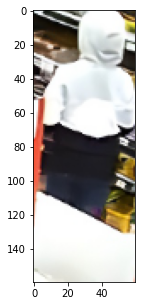

2 1


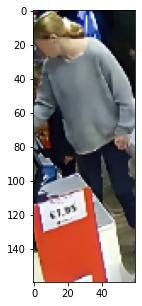

1 1


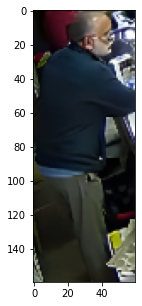

2 1


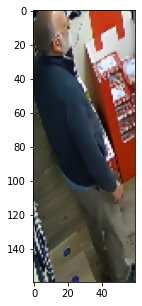

1 1


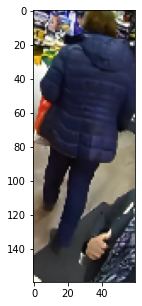

1 1


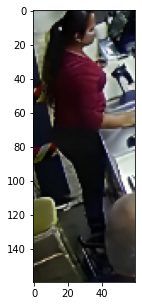

2 0


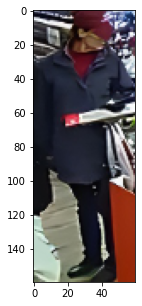

1 1


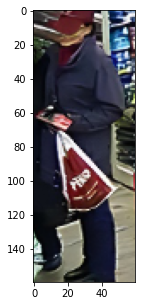

1 0


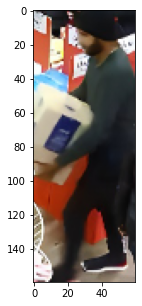

1 0


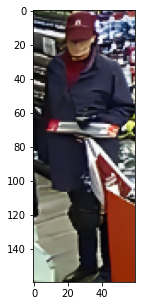

2 1


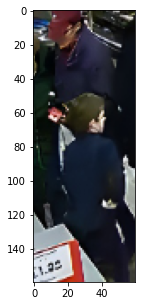

1 0


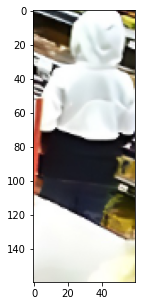

2 1


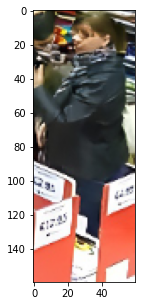

1 1


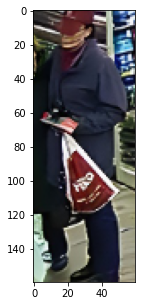

2 1


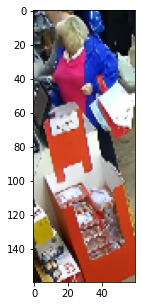

2 1


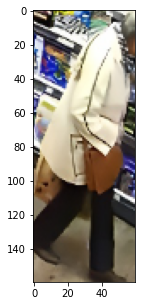

1 1


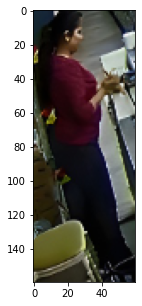

1 1


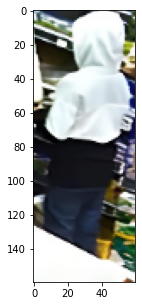

2 1


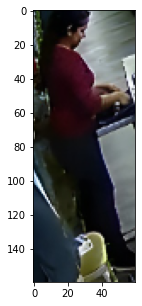

1 1


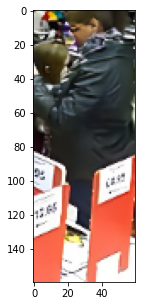

2 1


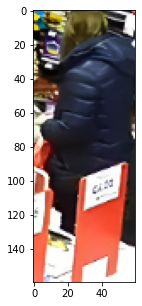

1 1


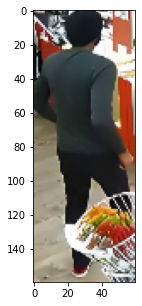

1 1


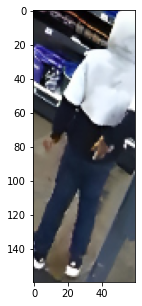

1 1


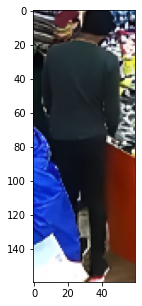

1 1


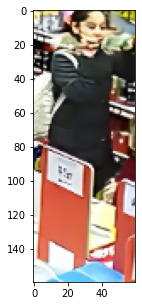

1 1


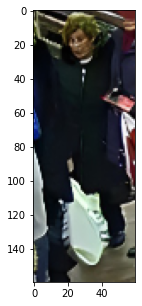

1 1


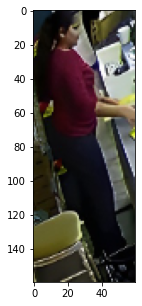

1 1


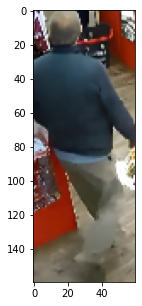

2 1


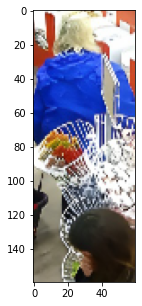

1 1


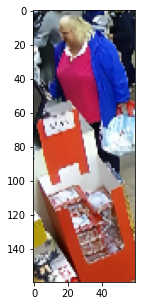

1 1


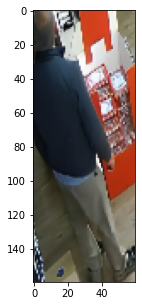

1 1


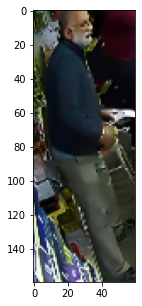

2 1


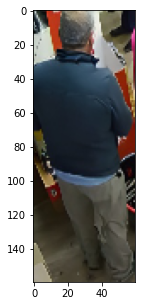

1 1


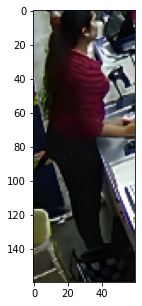

1 1


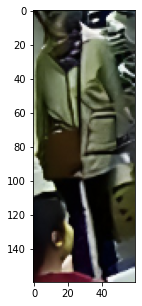

1 1


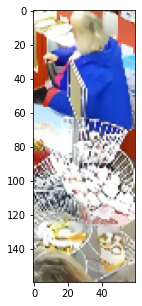

1 0


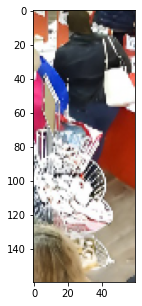

1 1


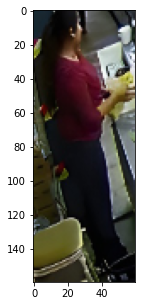

2 1


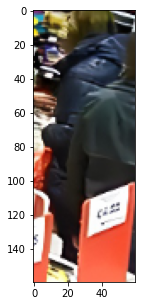

1 1


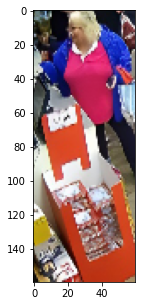

1 1


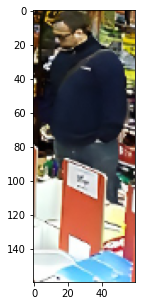

1 1


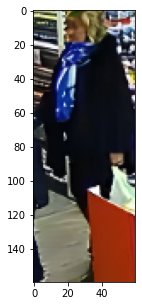

1 1


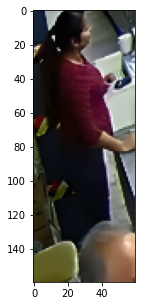

1 1


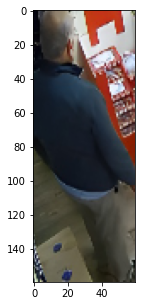

1 0


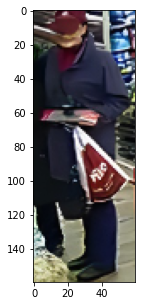

2 1


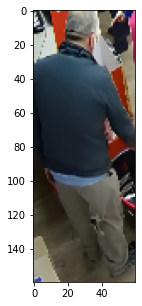

1 1


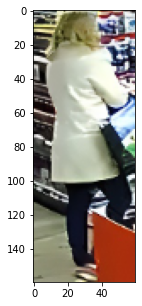

1 0


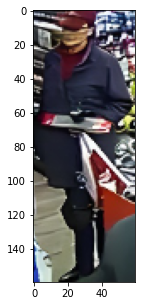

2 0


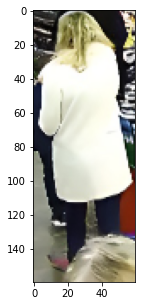

2 1


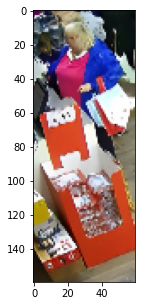

1 1


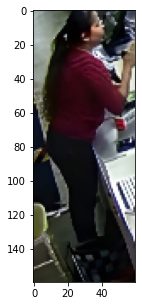

2 1


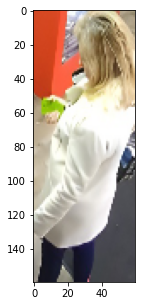

1 1


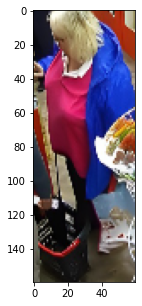

1 1


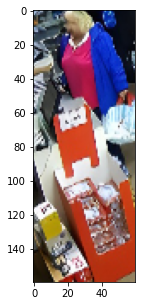

1 1


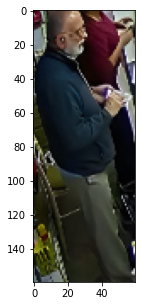

1 1


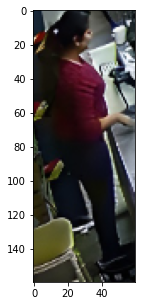

1 1


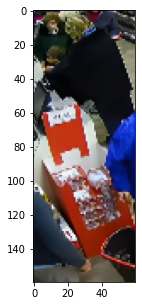

1 1


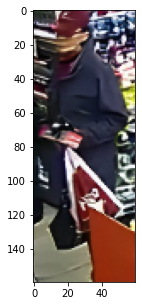

1 1


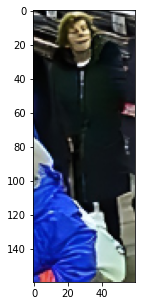

1 1


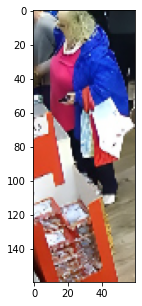

1 1


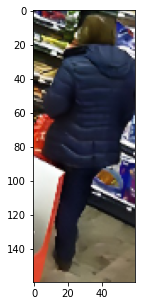

2 1


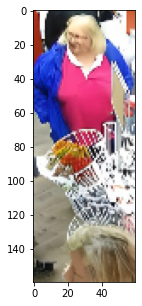

1 1


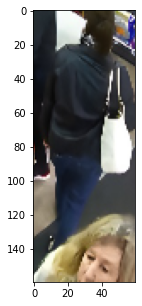

1 1


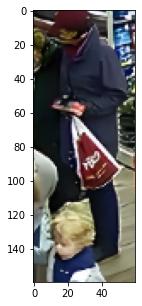

2 1


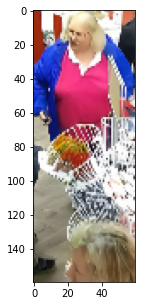

1 1


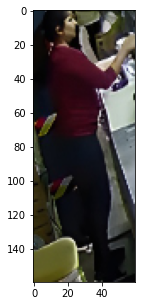

1 0


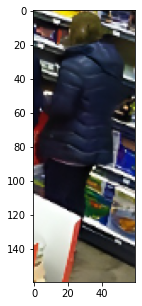

2 1


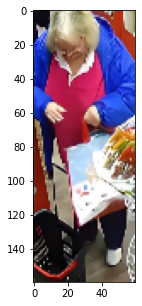

1 0


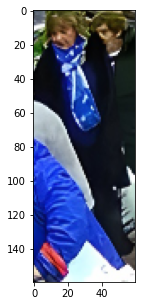

1 0


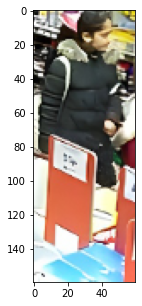

1 1


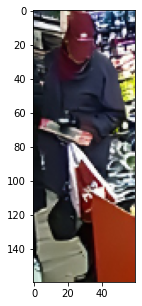

1 1


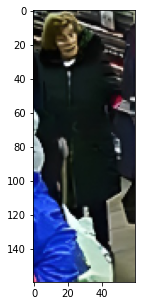

1 1


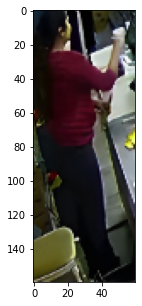

1 1


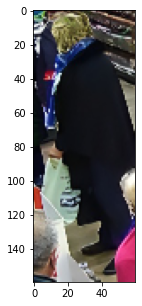

2 1


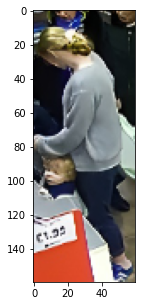

1 0


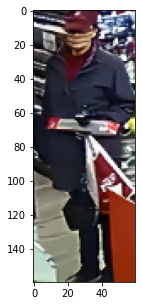

1 1


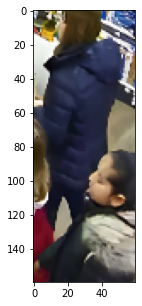

1 0


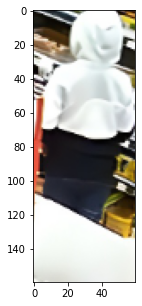

1 1


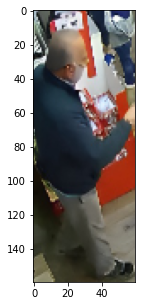

1 1


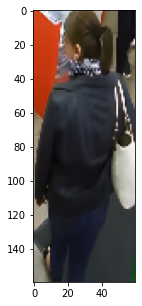

1 1


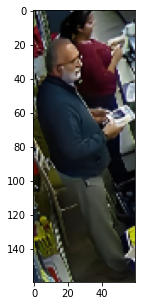

1 0


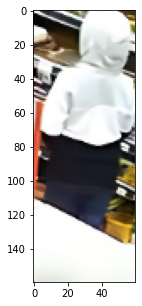

1 1


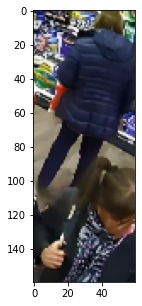

3 1


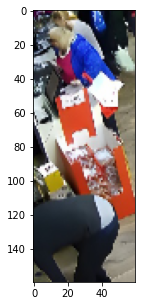

1 0


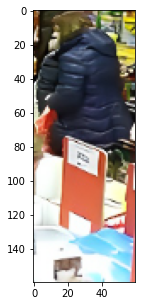

3 1


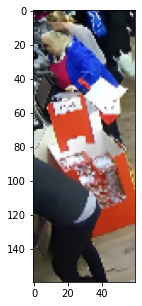

1 0


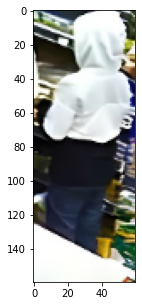

1 1


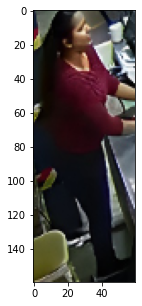

2 0


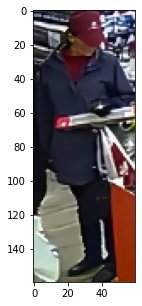

1 1


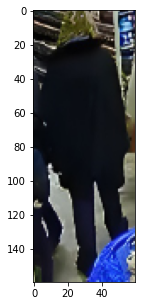

2 1


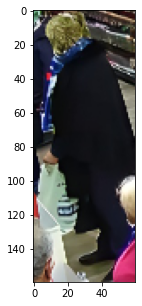

1 1


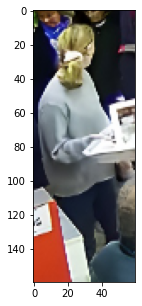

2 0


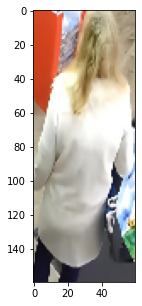

2 1


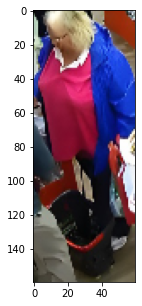

1 1


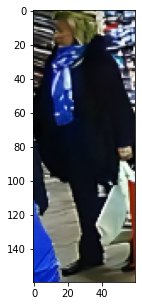

2 1


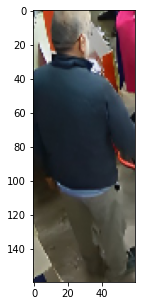

2 0


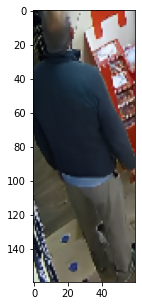

2 1


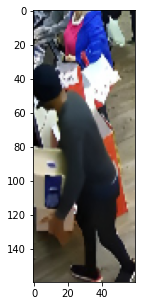

1 1


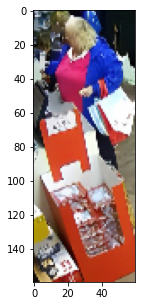

1 1


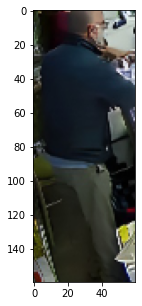

1 1


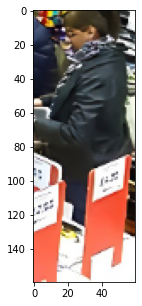

2 1


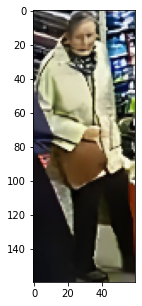

1 1


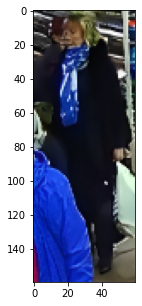

2 1


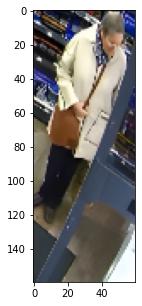

1 1


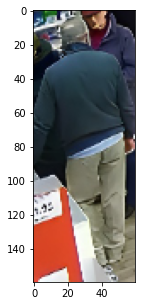

1 1


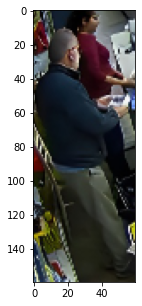

2 1


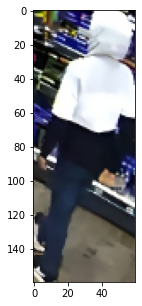

2 1


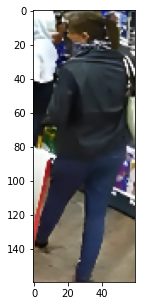

1 1


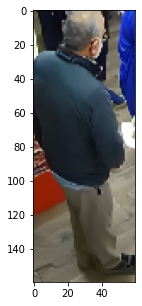

2 0


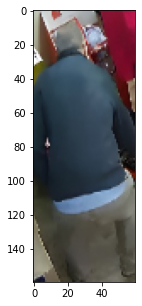

1 0


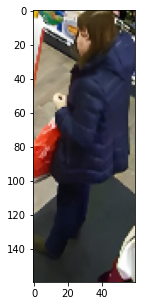

1 1


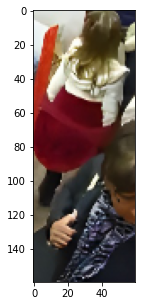

1 1


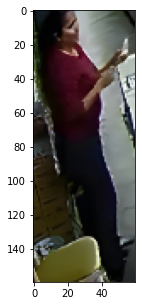

1 1


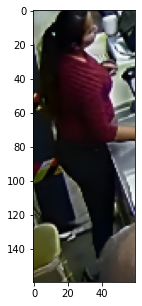

2 0


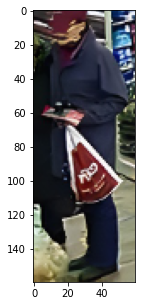

1 0


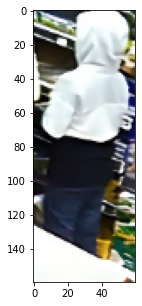

1 1


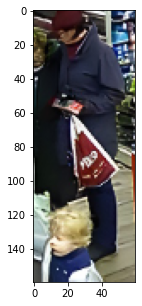

1 1


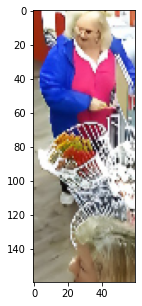

1 1


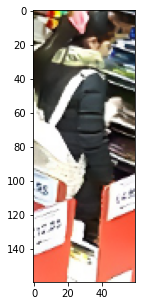

1 0


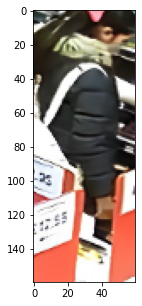

2 1


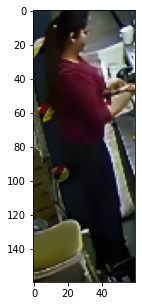

1 0


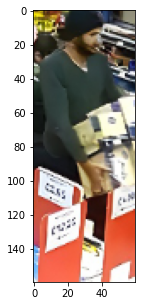

2 0


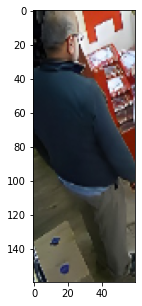

1 1


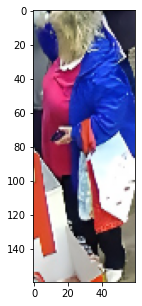

1 1


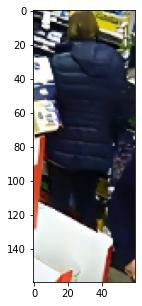

1 1


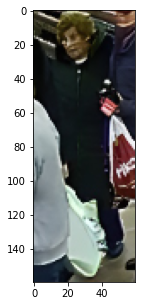

1 1


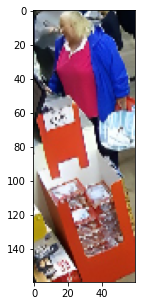

1 1


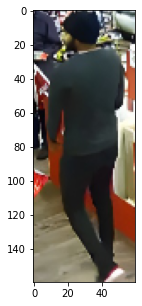

1 1


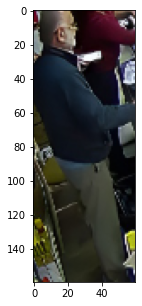

1 1


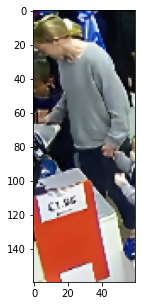

1 1


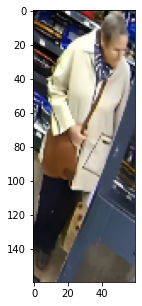

2 0


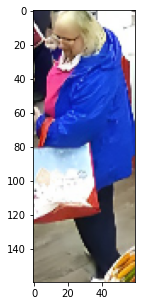

1 0


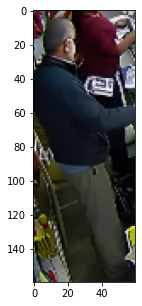

1 0


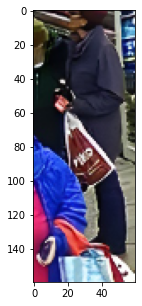

2 0


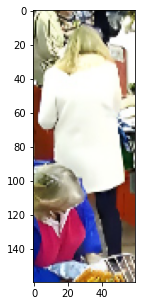

1 0


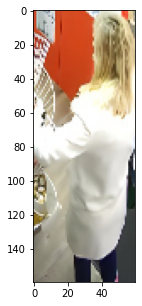

2 1


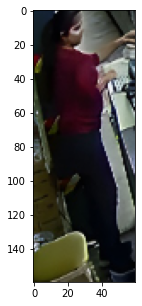

1 1


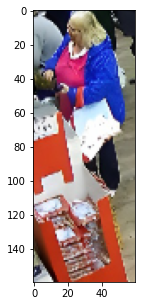

1 1


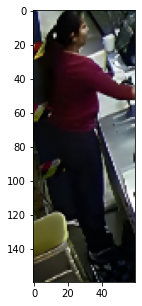

2 1


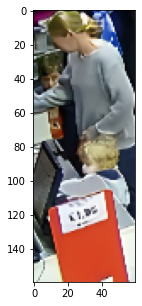

2 1


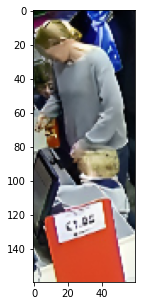

1 1


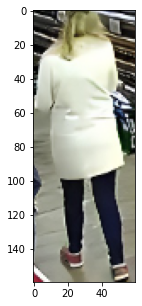

2 1


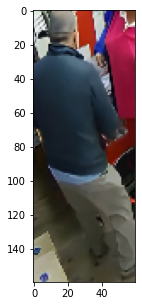

2 1


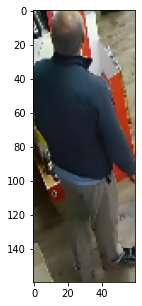

2 1


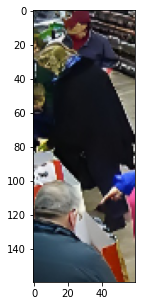

1 1


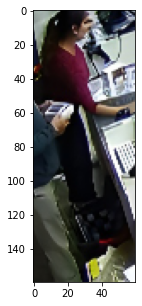

1 1


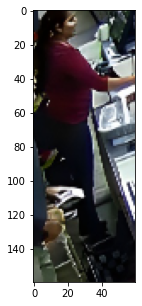

2 1


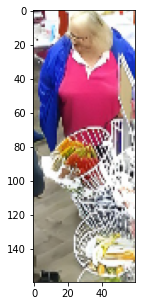

1 1


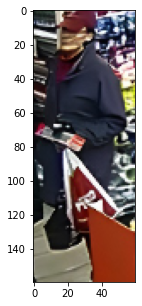

1 1


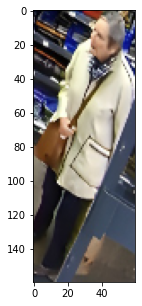

2 1


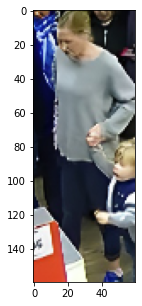

1 1


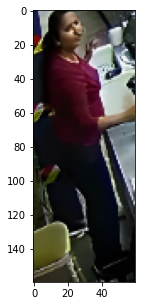

1 0


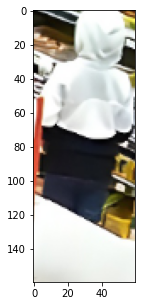

1 1


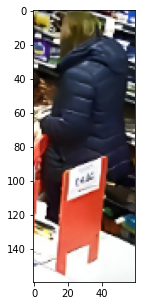

2 1


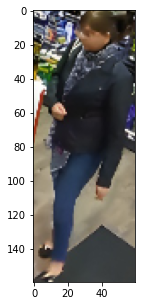

1 1


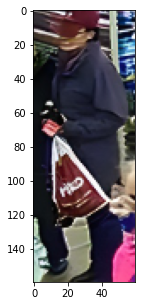

1 1


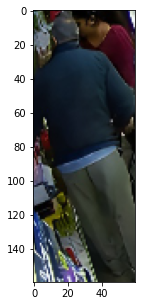

1 0


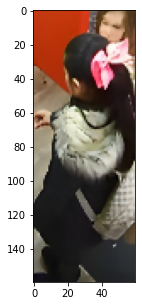

1 0


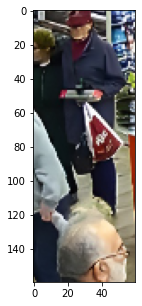

1 1


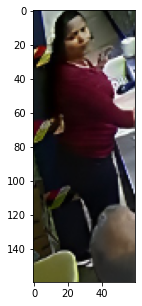

3 0


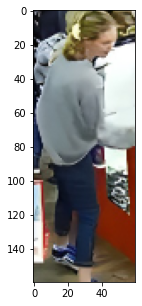

1 1


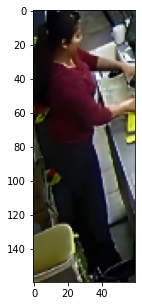

1 1


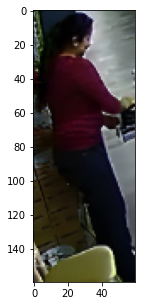

1 1


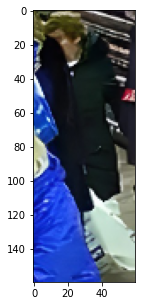

1 1


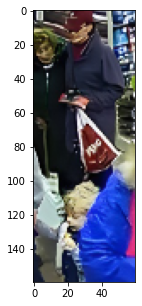

1 1


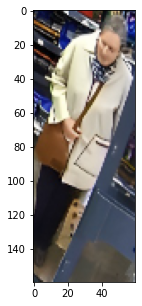

3 1


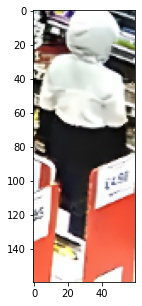

1 1


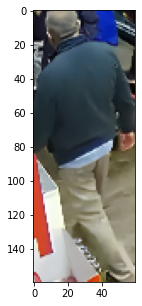

2 1


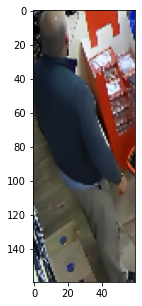

2 1


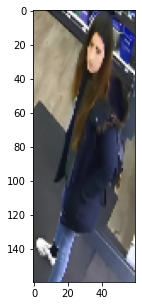

1 1


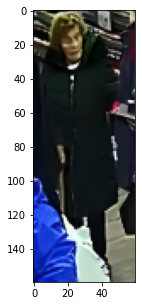

2 1


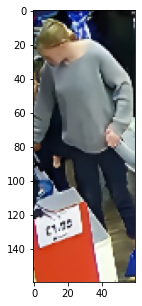

1 1


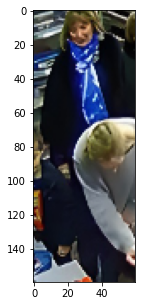

2 1


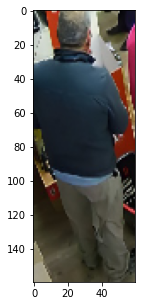

1 1


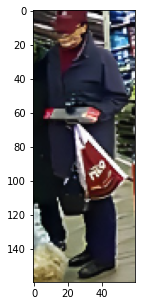

1 0


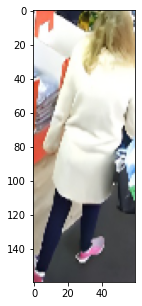

2 1


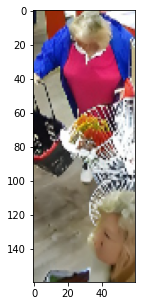

1 1


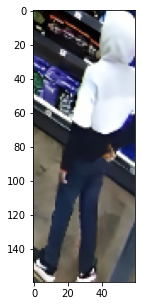

1 1


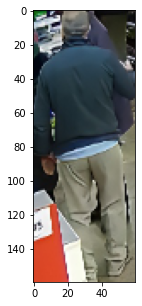

1 1


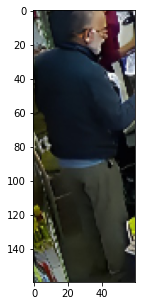

1 0


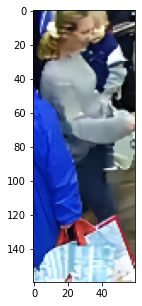

1 1


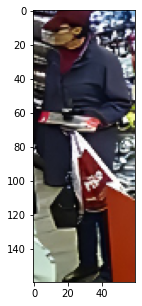

2 1


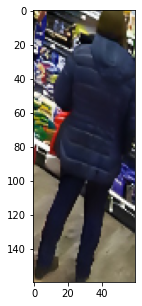

1 1


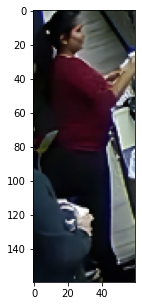

2 1


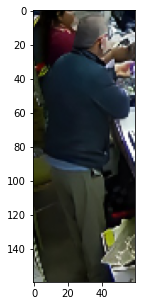

1 0


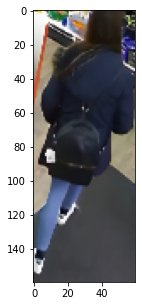

2 1


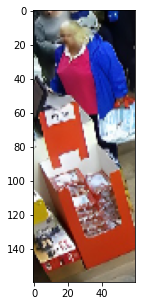

1 1


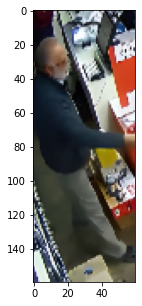

2 1


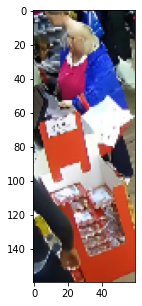

1 0


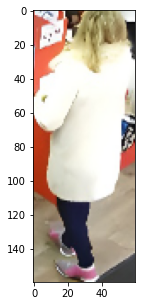

1 1


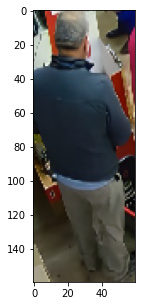

2 1


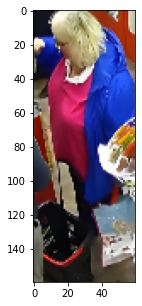

1 0


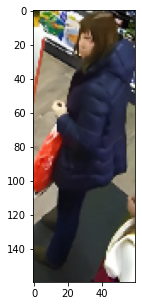

1 1


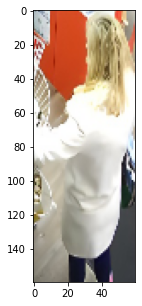

3 1


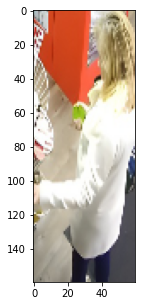

1 1


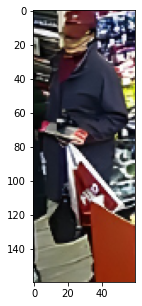

3 0


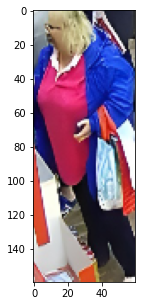

3 1


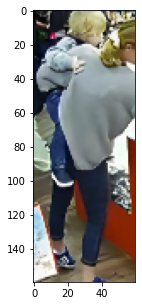

1 1


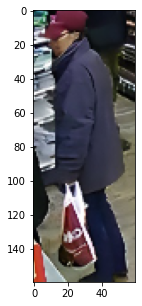

1 0


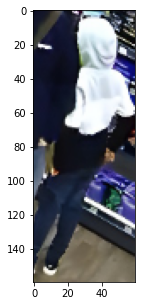

1 1


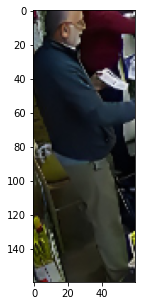

3 1


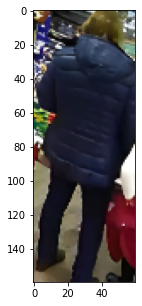

1 1


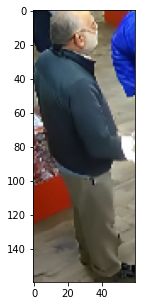

2 0


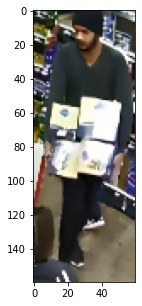

1 1


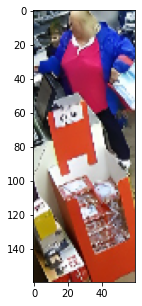

2 0


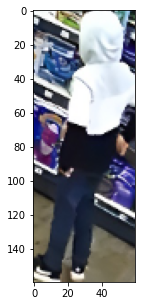

1 1


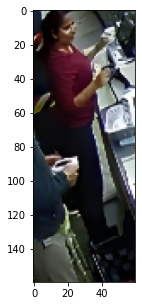

1 0


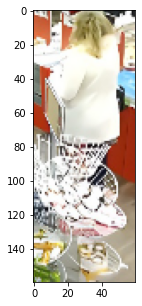

2 1


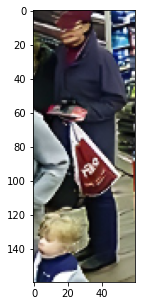

2 1


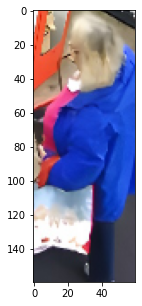

2 1


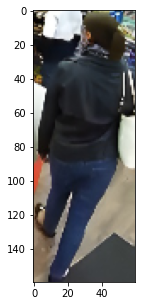

1 1


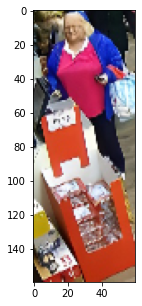

1 1


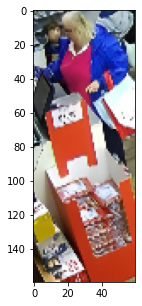

1 0


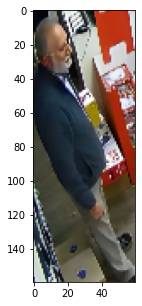

3 1


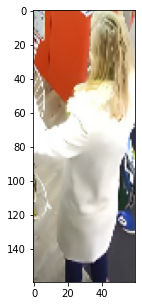

1 1


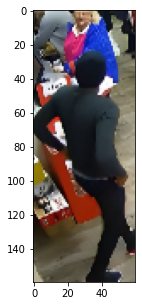

2 1


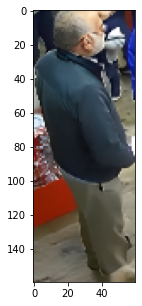

2 0


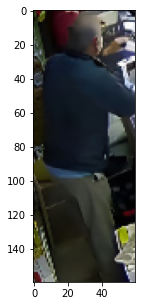

1 0


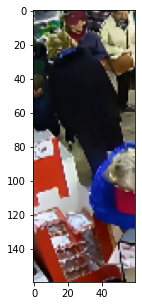

1 0


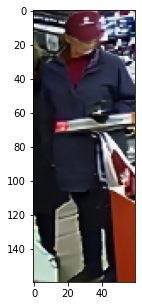

1 0


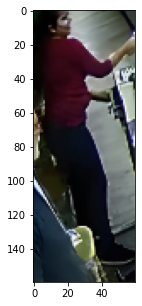

2 0


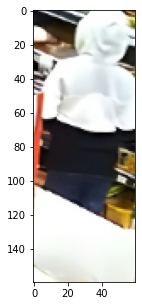

1 0


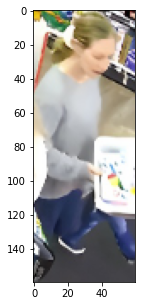

3 0


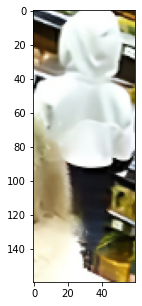

2 1


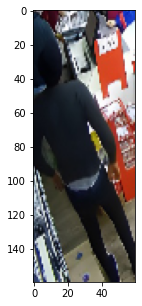

1 0


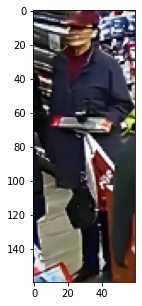

2 1


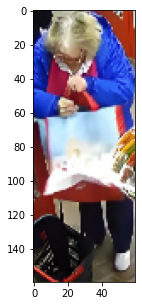

3 0


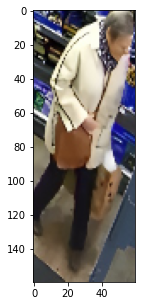

2 1


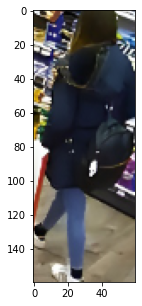

1 1


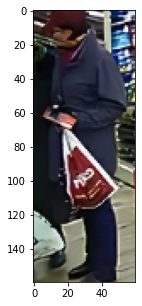

1 1


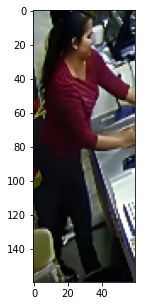

1 0


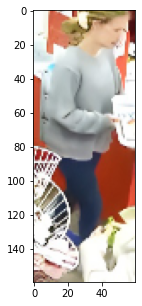

1 1


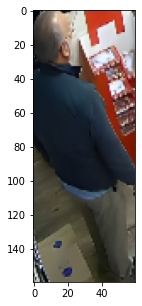

1 1


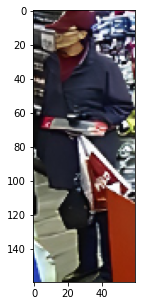

2 0


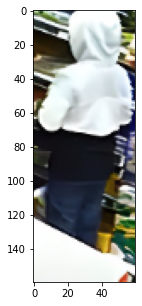

1 1


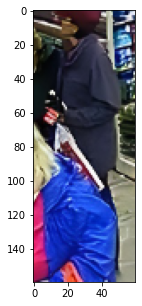

1 1


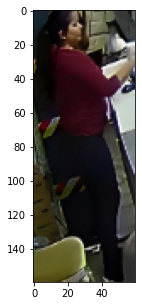

2 0


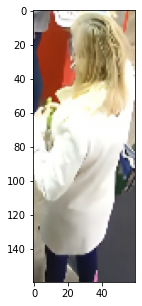

2 1


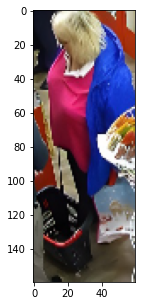

1 1


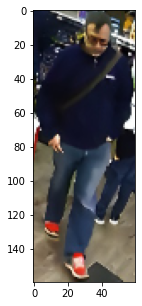

2 0


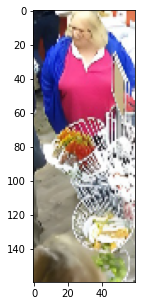

2 1


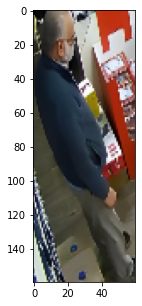

1 1


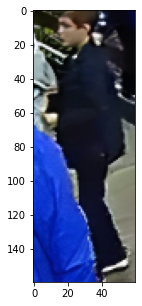

1 1


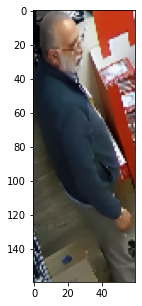

2 0


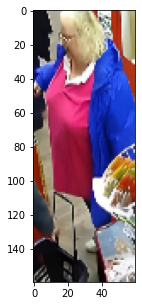

1 0


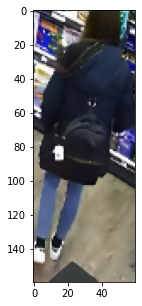

In [ ]:
from google.colab.patches import cv2_imshow

for i in range(len(preds_age)):
  plt.figure(figsize=(10, 5))
  plt.imshow(images[i])
  
  print(preds_age[i], preds_gender[i])
  plt.show()

## vgg16


In [ ]:
vgg16 = models.vgg16(pretrained=True)
vgg16 = nn.Sequential(*list(vgg16.children())[:-1])

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [ ]:
## Freezing the layers

for param in vgg16.parameters():
  param.requires_grad = False

In [ ]:
## Age and Gender prediction model

class AgeGenderPrediction_face(nn.Module):
    
    def __init__(self, age_labels, base_model = None):
      super().__init__()

      if base_model is None:
        self.base_model = vgg16()
      else:
        self.base_model = base_model
      self.gender_classification = nn.Sequential(
                                                  nn.Linear(in_features = 25088, out_features = 2, bias = True)
                                              )
      
      self.age_classification = nn.Sequential(
                                                  nn.Linear(in_features = 25088, out_features =age_labels, bias = True),
                                                  
                                              )

    def forward(self, x):
      base_output = self.base_model(x)
      base_output = base_output.view(base_output.shape[0], -1)
      gender = self.gender_classification(base_output)
      age = self.age_classification(base_output)

      return age, gender

In [ ]:
VGG16 = AgeGenderPrediction_face(24, vgg16)

In [ ]:
!gdown --id '1-FcOKMmwqdne3tsLJMYdCW18z888Jcxh'
VGG16.load_state_dict(torch.load('/content/0.231848.pth', map_location=torch.device('cpu')))

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1-FcOKMmwqdne3tsLJMYdCW18z888Jcxh 



FileNotFoundError: ignored

In [ ]:
model_body = nn.Sequential(*list(model_body.children())[0])

## **Facenet**

In [ ]:
!pip install facenet-pytorch 
from facenet_pytorch import MTCNN, InceptionResnetV1, training, fixed_image_standardization

In [ ]:
facenet = InceptionResnetV1(pretrained='vggface2', dropout_prob=0.5, device=device)

In [ ]:
facenet = nn.Sequential(*list(facenet.children())[:-3])

In [ ]:
for param in facenet.parameters():
  param.requires_grad = False

In [ ]:
## The Age and Gender Prediction model

import torch.nn as nn
import torch

class AgeGenderPrediction_face(nn.Module):
    
    def __init__(self, age_labels, base_model = None):
      super().__init__()

      if base_model is None:
        self.base_model = vgg16()
      else:
        self.base_model = base_model
      self.gender_classification = nn.Sequential(
                                                  nn.Linear(in_features = 1792, out_features = 512, bias = True),
                                                  nn.ReLU(inplace=True),
                                                  nn.Linear(in_features = 512, out_features = 256, bias = True),
                                                  nn.ReLU(inplace = True),
                                                  nn.Linear(in_features = 256, out_features = 2, bias = True),
                                              )
      
      self.age_classification = nn.Sequential(
                                                  nn.Linear(in_features = 1792, out_features = 512, bias = True),
                                                  nn.ReLU(inplace=True),
                                                  nn.Linear(in_features = 512, out_features = 256, bias = True),
                                                  nn.ReLU(inplace = True),
                                                  nn.Linear(in_features = 256, out_features = age_labels, bias = True),
                                                  
                                              )

    def forward(self, x):
      base_output = self.base_model(x)
      base_output = base_output.view(base_output.shape[0], -1)
      gender = self.gender_classification(base_output)
      age = self.age_classification(base_output)

      return age, gender

In [ ]:
FACENET = AgeGenderPrediction_face(24, facenet)

In [ ]:
!gdown --id '1-B_Khz8fveuKU3zMov3xumgeBJovB0t3'
#FACENET.load_state_dict(torch.load('/content/drive/MyDrive/Inter IIT M3/facenet/age and gender/0.354195.pth', map_location=torch.device('cpu')))

In [ ]:
model_body = nn.Sequential(*list(model_body.children())[0])

## Combining the facial as well as the body feature

Training, eval and test function of CombinedModelM3 

In [ ]:
def train(model, dataloaders, criterion_1, criterion_2, optimizer, device, num_epochs=1):
    model.train()

    
    # Define threshold
    t_age_acc = 0.7
    t_gender_acc = 0.7

    running_loss = 0.0
    running_corrects = 0
    for inputs_face, inputs_body, labels_age, labels_gender in tqdm(dataloaders):
      optimizer.zero_grad()
      inputs_face = inputs_face.to(device)
      inputs_body = inputs_body.to(device)
      labels_gender = labels_gender.to(device)
      labels_age = labels_age.to(device)

      age, gender = model(inputs_face, inputs_body)
      loss_1 = criterion_1(age, labels_age)
      loss_2 = criterion_2(gender, labels_gender)
      _, preds_age = torch.max(age, 1)
      _, preds_gender = torch.max(gender, 1)


      running_corrects+=torch.sum((preds_age == labels_age.data) & (preds_gender == labels_gender.data))

      age_accuracy = torch.sum((preds_age == labels_age.data))/len(inputs_face)
      gender_accuracy = torch.sum((preds_gender == labels_gender.data))/len(inputs_face)

      # print("Age Accuracy", bool(age_accuracy.item() <=t_age_acc))
      # print("Gender Accuracy", bool(gender_accuracy.item() <= t_gender_acc))
      ## Based upon the accuracy
      ans = (bool(age_accuracy.item() <=t_age_acc)) and (bool(gender_accuracy.item() <= t_gender_acc) )
      if(bool(ans)):
          loss = 0.5*(loss_1 + loss_2)

      elif(bool(age_accuracy.item() <=t_age_acc)):
        loss = 0.8*loss_1 + 0.2*loss_2

      else:
         loss = 0.2*loss_1 + 0.8*loss_2
      
      loss.backward()
      optimizer.step()
      running_loss+=loss.item()*inputs_face.size(0)

    epoch_loss = running_loss/len(dataloaders.dataset)
    epoch_acc = running_corrects.double()/len(dataloaders.dataset)
    
    return epoch_loss, epoch_acc

In [ ]:
def eval(model, dataloaders, criterion, device, num_epochs=1):
  model.eval()
  

  # Define threshold
  t_age_acc = 0.7
  t_gender_acc = 0.7  
  with torch.no_grad():

      running_loss = 0.0
      running_corrects = 0
      for inputs_face, inputs_body, labels_age, labels_gender in tqdm(dataloaders):
          inputs_face = inputs_face.to(device)
          inputs_body = inputs_body.to(device)
          labels_age = labels_age.to(device)
          labels_gender = labels_gender.to(device)

          age, gender = model(inputs_face, inputs_body)
          loss_1 = criterion(age, labels_age)
          loss_2 = criterion(gender, labels_gender)
          loss = loss_1 + loss_2
          _, preds_age = torch.max(age, 1)
          _, preds_gender = torch.max(gender, 1)


          running_corrects+=torch.sum((preds_age == labels_age.data) & (preds_gender == labels_gender.data))

          age_accuracy = torch.sum((preds_age == labels_age.data))/len(inputs_face)
          gender_accuracy = torch.sum((preds_gender == labels_gender.data))/len(inputs_face)

          ## Based upon the accuracy
          ans = (bool(age_accuracy.item() <=t_age_acc)) and (bool(gender_accuracy.item() <= t_gender_acc))
          
          if(bool(ans)):
              loss = 0.5*(loss_1 + loss_2)

          elif(bool(age_accuracy.item() <=t_age_acc)):
            loss = 0.8*loss_1 + 0.2*loss_2

          else:
            loss = 0.2*loss_1 + 0.8*loss_2

          running_loss+=loss.item()*inputs_face.size(0)

      epoch_loss = running_loss/len(dataloaders.dataset)
      epoch_acc = running_corrects.double()/len(dataloaders.dataset)


  return epoch_loss, epoch_acc

In [ ]:
def run(train_dl, val_dl, epochs):
    model_combined = CombinedModelM3(vgg16, model_body)
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()
    device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
    model_combined.to(device)

    accuracies = []
    losses = []

    best_acc = 0.0
    
    for epoch in range(epochs):
        train_loss, train_acc = train(model_combined, train_dl, criterion, criterion, optimizer, device)
        val_loss, val_acc = eval(model_combined, val_dl, criterion, device)

        if val_acc > best_acc:
          best_acc =val_acc
          torch.save(model.state_dict(), os.path.join('/content/drive/MyDrive/Inter IIT M3/scratch/age and gender', '{0:0=2f}.pth'.format(best_acc)))

        print("Train loss for epoch {}".format(epoch+1) , "is ", train_loss ," and train accuracy is ", train_acc)
        print("Validation loss for epoch {}".format(epoch+1) , "is ", val_loss ," and validation accuracy is ", val_acc)
    
    print("Best validation accuracy obtained is ", best_acc)

## Dataloader, defining model, calling train function, validation function for CombinedModelM3

In [ ]:
df2 = pd.read_csv('/content/drive/MyDrive/Inter IIT/finalm3_dataframe.csv')
!unzip '/content/drive/MyDrive/Inter IIT/testing files/all_faces1.zip' -d '/content/all_peta_faces2'
df2

In [ ]:
!mv '/content/all_peta_faces2/content/all_faces_peta' '/content/all_faces_peta'

In [ ]:
from sklearn.model_selection import train_test_split as tts

In [ ]:
!zip -r /content/all_faces_peta.zip /content/all_faces_peta
from google.colab import files
files.download("/content/all_faces_peta.zip")

In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.models as models
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import cv2
import os
import seaborn as sns
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import confusion_matrix
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt

In [ ]:
def func(row):
  return os.path.exists(row['Path_face']) & os.path.exists('/content/drive/MyDrive/'+row['Path'])

In [ ]:
 df2 = df2.drop(list(df2[df2['Gender']==2].index))
 df2 = df2.drop(list(df2[df2['Age']==5].index))
 df2['exist']  = df2.apply(func,axis = 1)
 df2 = df2[df2['exist']==True]
 df2 = df2.drop(columns = ['exist'], axis = 1)

In [ ]:
from sklearn.model_selection import train_test_split as tts
train_df, valid_df = tts(df2, test_size= 0.3)
valid_df, test_df = tts(valid_df, test_size = 0.2)

In [ ]:
train_df

In [ ]:
## Train dataset


class Train_Prepare(Dataset):
  """
  The Class will act as the container for our dataset. It will take your dataframe, the root path, and also the transform function for transforming the dataset.
  """
  def __init__(self, data_frame, root_dir_face, root_dir_body, transform_face=None, transform_body=None):
    self.data_frame = data_frame
    self.root_dir_face = root_dir_face
    self.root_dir_body = root_dir_body
    self.transform_face = transform_face
    self.transform_body = transform_body
  def __len__(self):
    # Return the length of the dataset
    return len(self.data_frame)
  def __getitem__(self, idx):
    # Return the observation based on an index. Ex. dataset[0] will return the first element from the dataset, in this case the image and the label.
    if torch.is_tensor(idx):
      idx = idx.tolist()    

    try:
      img_name_face = os.path.join(self.root_dir_face, str(self.data_frame.iloc[idx, 0]))
      image_face = Image.open(img_name_face)

    except:
      image_face = np.zeros(1000,1000, 3)
    try:    
      img_name_body = os.path.join(self.root_dir_body, str(self.data_frame.iloc[idx, 1]))
      image_body = Image.open(img_name_body)
    
    except:
      image_body = np.zeros(1000,1000,3)
    
    label_age = self.data_frame.iloc[idx, 2]
    label_gender = self.data_frame.iloc[idx, 3]
    if self.transform_face:
      image_face = self.transform_face(image_face)
    if self.transform_body:
      image_body = self.transform_body(image_body)
    return (image_face, image_body, label_age, label_gender)

class Val_Prepare(Dataset):
  """
  The Class will act as the container for our dataset. It will take your dataframe, the root path, and also the transform function for transforming the dataset.
  """
  def __init__(self, data_frame, root_dir_face, root_dir_body, transform_face=None, transform_body=None):
    self.data_frame = data_frame
    self.root_dir_face = root_dir_face
    self.root_dir_body = root_dir_body
    self.transform_face = transform_face
    self.transform_body = transform_body
  def __len__(self):
    # Return the length of the dataset
    return len(self.data_frame)
  def __getitem__(self, idx):
    # Return the observation based on an index. Ex. dataset[0] will return the first element from the dataset, in this case the image and the label.
    if torch.is_tensor(idx):
      idx = idx.tolist()    
    try:
      img_name_face = os.path.join(self.root_dir_face, str(self.data_frame.iloc[idx, 0]))
      image_face = Image.open(img_name_face)

    except:
      image_face = np.zeros(1000,1000, 3)
    try:    
      img_name_body = os.path.join(self.root_dir_body, str(self.data_frame.iloc[idx, 1]))
      image_body = Image.open(img_name_body)
    
    except:
      image_body = np.zeros(1000,1000,3)
    label_age = self.data_frame.iloc[idx, 2]
    label_gender = self.data_frame.iloc[idx, 3]
    if self.transform_face:
      image_face = self.transform_face(image_face)
    if self.transform_body:
      image_body = self.transform_body(image_body)
    return (image_face, image_body, label_age, label_gender)

def data_preparation(Data_Class_1, Data_Class_2, root_directory_face, root_directory_body, train_df, val_df, Batch_Size = 128, Shuffle = False):
  train_dataset = Data_Class_1(data_frame=train_df,root_dir_face=root_directory_face, root_dir_body=root_directory_body, transform_face = transforms.Compose([transforms.ToTensor(), transforms.Resize((100, 100))]), transform_body = transforms.Compose([transforms.ToTensor(), transforms.Resize((224, 100))]))
  train_loader = torch.utils.data.DataLoader(dataset = train_dataset, batch_size = Batch_Size, shuffle = Shuffle, pin_memory=True)
  val_dataset = Data_Class_2(data_frame=val_df,root_dir_face=root_directory_face, root_dir_body = root_directory_body, transform_face = transforms.Compose([transforms.ToTensor(), transforms.Resize((100, 100))]), transform_body = transforms.Compose([transforms.ToTensor(), transforms.Resize((224, 100))]))
  val_loader = torch.utils.data.DataLoader(dataset = val_dataset, batch_size = Batch_Size, shuffle = Shuffle, pin_memory=True)
  return train_loader, val_loader

## train loader

In [ ]:
train_loader, val_loader = data_preparation(Train_Prepare, Val_Prepare, '', '/content/drive/MyDrive/', train_df, valid_df, Batch_Size = 128, Shuffle = True)

In [ ]:
run(train_loader, val_loader, 2)

Inference of CombinedModelM3

In [ ]:
# ## Load the weights of the model, and rememer to remove the last classification layer from each of the model\

# '''
# code for loadfing t
# '''
# !gdown
model_combined = CombinedModelM3(vgg16, model_body)
try:
  model_combined.load_state_dict(torch.load('/content/', map_location=torch.device('cpu')))
except:
  print("Cant load the weights")


In [ ]:
class Test_Prepare_for_combined(Dataset):
  """
  The Class will act as the container for our dataset. It will take your dataframe, the root path, and also the transform function for transforming the dataset.
  """
  def __init__(self, base_path_body, base_path_face, entry_body, entry_face, transform=None):
    self.base_path_body = base_path_body
    self.base_path_face = base_path_face
    self.entry_body = entry_body
    self.entry_face = entry_face
    self.transform = transform
  def __len__(self):
    # Return the length of the dataset
    return len(self.entry_body)
  def __getitem__(self, idx):
    # Return the observation based on an index. Ex. dataset[0] will return the first element from the dataset, in this case the image and the label.
    if torch.is_tensor(idx):
      idx = idx.tolist()    
    try:
      img_name_face = os.path.join(self.root_dir_face, str(self.data_frame.iloc[idx, 0]))
      image_face = Image.open(img_name_face)

    except:
      image_face = np.zeros(1000,1000, 3)
    try:    
      img_name_body = os.path.join(self.root_dir_body, str(self.data_frame.iloc[idx, 1]))
      image_body = Image.open(img_name_body)
    
    except:
      image_body = np.zeros(1000,1000,3)
    if self.transform:
      image_body = self.transform(image_body)
      image_face = self.transform(image_face)
    return image_body, image_face

In [ ]:
def data_preparation_test(Data_Class_1, root_directory_face, root_directory_body, train_df, Batch_Size = 128, Shuffle = False):
  train_dataset = Data_Class_1(data_frame=train_df,root_dir_face=root_directory_face, root_dir_body=root_directory_body, transform_face = transforms.Compose([transforms.ToTensor(), transforms.Resize((100, 100))]), transform_body = transforms.Compose([transforms.ToTensor(), transforms.Resize((224, 100))]))
  train_loader = torch.utils.data.DataLoader(dataset = train_dataset, batch_size = Batch_Size, shuffle = Shuffle, pin_memory=True)
  return train_loader

In [ ]:
test_loader_peta = data_preparation(Test_Prepare_for_combined, '', '/content/drive/MyDrive/', test_df, Batch_Size = 128, Shuffle = True)

In [ ]:
def Test(model, dataloaders, device, num_epochs=1):
  model.eval()
  
  with torch.no_grad():

      running_loss = 0.0
      running_corrects = 0
      age_p =[]
      gender_p = []
      for inputs_face, inputs_body in tqdm(dataloaders):
          inputs_face = inputs_face.to(device)
          inputs_body = inputs_body.to(device)

          age, gender = model(inputs_face, inputs_body)
          _, preds_age = torch.max(age, 1)
          _, preds_gender = torch.max(gender, 1)
          age_p.extend(age.detach().cpu().numpy().tolist())
          gender_p.extend(gender.detach().cpu().numpy().tolist())


  return age_p, gender_p

In [ ]:
age_p, gender_p = Test(combined_model, test_loader_peta, device = 'cuda')
test_df['gender'] = gender_p

In [ ]:
actual_age = []
for i in age_p:
  entry = age_p
  if entry == 0:
    actual_age.append(1, 15)

  elif entry == 1:
    actual_age.append(16, 30)


  elif entry == 2:
    actual_age.append(31, 45)


  elif entry == 3:
    actual_age.append(46, 60)

  else:
    actual_age.append(60, 100)


In [ ]:
actual_age = np.array(actual_age)

In [ ]:
test_df['age_min'] = actual_age[:, 0]
test_df['age_max'] = actual_age[:, 1]

In [ ]:
def func(x):
  if x==1:
    return 'M'
  return 'F'

In [ ]:
test_df['gender']  = test_df['gender'].apply(lambda x: func(x))

In [ ]:
test_loader = data_preparation(Test_Prepare_for_combined, '/content/face_images/', '/content/body_images', test_df, Batch_Size = 128, Shuffle = True)

In [ ]:
def func_get_box(row, all_boxes, parameter = 'xmin'):
  if parameter == 'xmin':
    return all_boxes[row['Path']][0]
  elif parameter == 'ymin':
    return all_boxes[row['Path']][2]
  elif parameter == 'width':
    return all_boxes[row['Path']][1] -  all_boxes[row['Path']][0]
  else:
    return all_boxes[row['Path']][3] -  all_boxes[row['Path']][2]

In [ ]:
test_df['bb_xmin'] = test_df.apply(lambda x: func_get_box(x, all_boxes, 'xmin'),axis = 1)
test_df['bb_ymin'] = test_df.apply(lambda x: func_get_box(x, all_boxes, 'ymin'),axis = 1)
test_df['bb_width'] = test_df.apply(lambda x: func_get_box(x, all_boxes, 'width'),axis = 1)
test_df['bb_height'] = test_df.apply(lambda x: func_get_box(x, all_boxes, 'height'),axis = 1)

In [ ]:
test_df.to_csv('submission.csv', index = False)